# Import the main libraries


In [133]:
import plotly.express as px
# Most important
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings("ignore")
import os
import plotly.express as px

# Insert Data set

In [134]:
data = pd.read_csv('Invistico_Airline.csv')

In [135]:
df_air=data.copy()

# Inspect the Data

In [136]:
df_air.head()

,satisfaction,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Seat comfort,Departure/Arrival time convenient,Food and drink,...,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding,Departure Delay in Minutes,Arrival Delay in Minutes
0,satisfied,Female,Loyal Customer,65,Personal Travel,Eco,265,0,0,0,...,2,3,3,0,3,5,3,2,0,0.0
1,satisfied,Male,Loyal Customer,47,Personal Travel,Business,2464,0,0,0,...,2,3,4,4,4,2,3,2,310,305.0
2,satisfied,Female,Loyal Customer,15,Personal Travel,Eco,2138,0,0,0,...,2,2,3,3,4,4,4,2,0,0.0
3,satisfied,Female,Loyal Customer,60,Personal Travel,Eco,623,0,0,0,...,3,1,1,0,1,4,1,3,0,0.0
4,satisfied,Female,Loyal Customer,70,Personal Travel,Eco,354,0,0,0,...,4,2,2,0,2,4,2,5,0,0.0


In [137]:
df_air.tail()

,satisfaction,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Seat comfort,Departure/Arrival time convenient,Food and drink,...,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding,Departure Delay in Minutes,Arrival Delay in Minutes
129875,satisfied,Female,disloyal Customer,29,Personal Travel,Eco,1731,5,5,5,...,2,2,3,3,4,4,4,2,0,0.0
129876,dissatisfied,Male,disloyal Customer,63,Personal Travel,Business,2087,2,3,2,...,1,3,2,3,3,1,2,1,174,172.0
129877,dissatisfied,Male,disloyal Customer,69,Personal Travel,Eco,2320,3,0,3,...,2,4,4,3,4,2,3,2,155,163.0
129878,dissatisfied,Male,disloyal Customer,66,Personal Travel,Eco,2450,3,2,3,...,2,3,3,2,3,2,1,2,193,205.0
129879,dissatisfied,Female,disloyal Customer,38,Personal Travel,Eco,4307,3,4,3,...,3,4,5,5,5,3,3,3,185,186.0


In [138]:
df_air.shape

(129880, 23)

Summary to all columns

In [139]:
def check(df):
    l=[]
    columns=df.columns
    for col in columns:
        dtypes=df[col].dtypes
        nunique=df[col].nunique()
        sum_null=df[col].isnull().sum()
        l.append([col,dtypes,nunique,sum_null])
    df_check=pd.DataFrame(l)
    df_check.columns=['column','dtypes','nunique','sum_null']
    return df_check 
check(df_air)

,column,dtypes,nunique,sum_null
0,satisfaction,object,2,0
1,Gender,object,2,0
2,Customer Type,object,2,0
3,Age,int64,75,0
4,Type of Travel,object,2,0
5,Class,object,3,0
6,Flight Distance,int64,5398,0
7,Seat comfort,int64,6,0
8,Departure/Arrival time convenient,int64,6,0
9,Food and drink,int64,6,0


Divide into numerical and categorical columns

In [140]:
Categorical_columns = df_air.select_dtypes(include=['object'])
Numerical_columns = df_air.select_dtypes(exclude=['object'])

Stats about Numerical columns

In [141]:
Numerical_columns.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,129880.0,39.427957,15.119360,7.0,27.0,40.0,51.0,85.0
Flight Distance,129880.0,1981.409055,1027.115606,50.0,1359.0,1925.0,2544.0,6951.0
Seat comfort,129880.0,2.838597,1.392983,0.0,2.0,3.0,4.0,5.0
Departure/Arrival time convenient,129880.0,2.990645,1.527224,0.0,2.0,3.0,4.0,5.0
Food and drink,129880.0,2.851994,1.443729,0.0,2.0,3.0,4.0,5.0
Gate location,129880.0,2.990422,1.305970,0.0,2.0,3.0,4.0,5.0
Inflight wifi service,129880.0,3.249130,1.318818,0.0,2.0,3.0,4.0,5.0
Inflight entertainment,129880.0,3.383477,1.346059,0.0,2.0,4.0,4.0,5.0
Online support,129880.0,3.519703,1.306511,0.0,3.0,4.0,5.0,5.0
Ease of Online booking,129880.0,3.472105,1.305560,0.0,2.0,4.0,5.0,5.0


Stats about categorical columns

In [142]:
Categorical_columns.describe().T

,count,unique,top,freq
satisfaction,129880,2,satisfied,71087
Gender,129880,2,Female,65899
Customer Type,129880,2,Loyal Customer,106100
Type of Travel,129880,2,Business travel,89693
Class,129880,3,Business,62160


#  Finding Missing values

In [143]:
df_air.isnull().sum()


satisfaction                           0
Gender                                 0
Customer Type                          0
Age                                    0
Type of Travel                         0
Class                                  0
Flight Distance                        0
Seat comfort                           0
Departure/Arrival time convenient      0
Food and drink                         0
Gate location                          0
Inflight wifi service                  0
Inflight entertainment                 0
Online support                         0
Ease of Online booking                 0
On-board service                       0
Leg room service                       0
Baggage handling                       0
Checkin service                        0
Cleanliness                            0
Online boarding                        0
Departure Delay in Minutes             0
Arrival Delay in Minutes             393
dtype: int64

In [144]:
df_air.columns

Index(['satisfaction', 'Gender', 'Customer Type', 'Age', 'Type of Travel',
       'Class', 'Flight Distance', 'Seat comfort',
       'Departure/Arrival time convenient', 'Food and drink', 'Gate location',
       'Inflight wifi service', 'Inflight entertainment', 'Online support',
       'Ease of Online booking', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Cleanliness', 'Online boarding',
       'Departure Delay in Minutes', 'Arrival Delay in Minutes'],
      dtype='object')

The column corresponding to the Arrival Delay in Minutes feature has 393 missing values.
Many columns contain categorical values but are of type 'object' or 'int64'. Let's replace this type with a special one designed for storing categorical values.

# Check for Duplicates

In [145]:
df_air.duplicated().sum()

0

# Data Visualization


<AxesSubplot:>

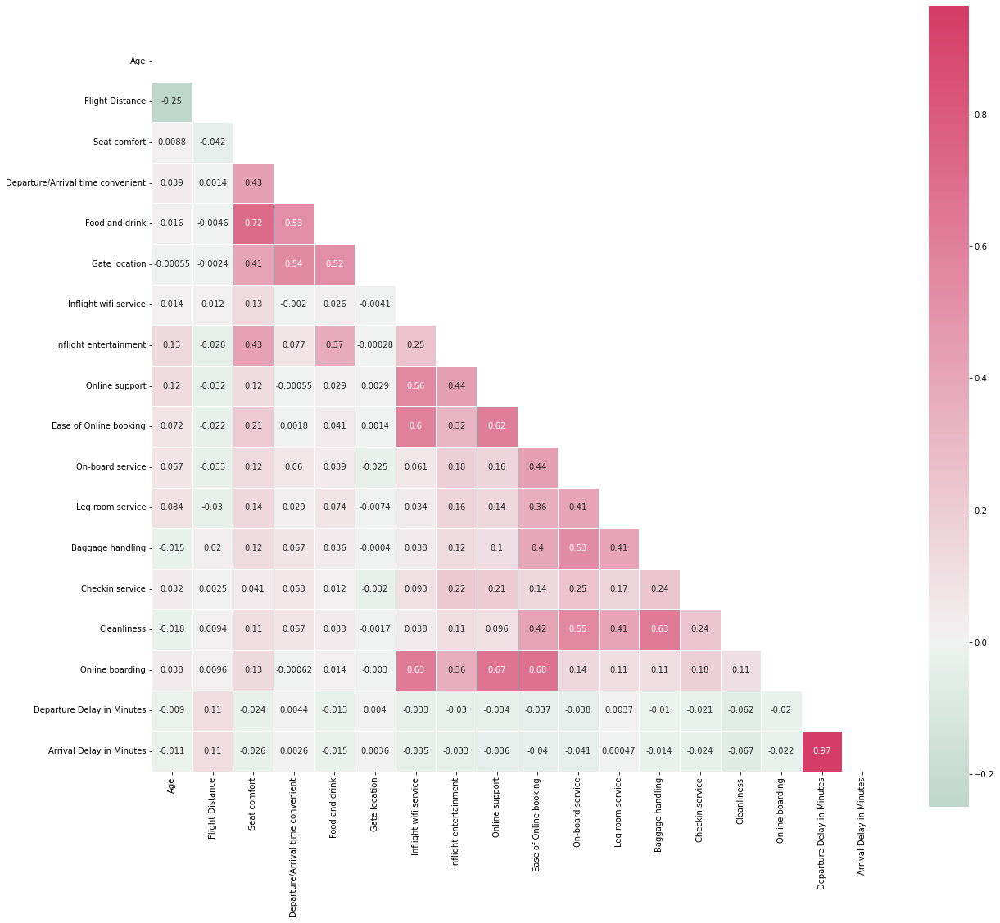

In [146]:
corr = df_air.corr()
mask = np.triu(np.ones_like(corr, dtype=np.bool))
f, ax = plt.subplots(figsize=(20, 20))
cmap = sns.diverging_palette(150, 1, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=None, center=0,square=True, annot=True, linewidths=.5, cbar_kws={"shrink": .9})

There is a significat correlation between Departure Delay in Minutes and Arrival Delay in Minutes so we will drop one of 2 freatures to avoid multicolinearity problem.
Encoding for categorical data, as our categorical columns not ordinal columns we will use getdummies function to encode them.

In [147]:
df_air = df_air.drop("Arrival Delay in Minutes",axis=1)

#How Many People are Satisfied and Dissatisfied ?

In [148]:
fig=px.pie(df_air,values=df_air["satisfaction"].value_counts(),
           names=["Satisfied","Dissatisfied"],title="<b>Satisfied And Dissatisfied Ratio",
           hole=.6,
       color_discrete_sequence=px.colors.qualitative.Pastel,template="plotly")
fig.update_layout(title_font_size=30)
fig.show()

Gender level satisfaction

In [149]:
fig=px.histogram(df_air,x="Gender",facet_col="satisfaction",color="satisfaction",color_discrete_sequence=px.colors.qualitative.Alphabet)
fig.update_layout(title="<b>"+"Gender"+" vs satisfaction", title_font_size=30,
                     font_size=20,
                     title_x=0.5,
                     hoverlabel_font_size=20,template="plotly")

fig.show()

Which class has more dissatisfied people

In [150]:
fig=px.histogram(df_air,x="Class",color="satisfaction",title="<b>Count of satisfied and dissatisfied in each class",
                color_discrete_sequence=px.colors.qualitative.Vivid)
fig.update_layout(template="plotly")
fig.update_layout(title_font_size=30)
fig.show()

Type of Travel vs satisfaction

In [151]:
fig=px.histogram(df_air,x="Type of Travel",facet_col="satisfaction",color="satisfaction")
fig.update_layout(title="<b>"+"Type of Travel"+" vs satisfaction", title_font_size=20,
                     font_size=20,
                     title_x=0.5,
                     hoverlabel_font_size=20,template="plotly")

fig.show()

Encoding for object features

In [152]:
for i in df_air.select_dtypes(include=['object']):
        le = LabelEncoder()
        df_air[i] = le.fit_transform(df_air[i])

# Data Preprocessing

In [153]:
df_air.isnull().sum()

satisfaction                         0
Gender                               0
Customer Type                        0
Age                                  0
Type of Travel                       0
Class                                0
Flight Distance                      0
Seat comfort                         0
Departure/Arrival time convenient    0
Food and drink                       0
Gate location                        0
Inflight wifi service                0
Inflight entertainment               0
Online support                       0
Ease of Online booking               0
On-board service                     0
Leg room service                     0
Baggage handling                     0
Checkin service                      0
Cleanliness                          0
Online boarding                      0
Departure Delay in Minutes           0
dtype: int64

Scaling

In [154]:
from sklearn import preprocessing
r_scaler = preprocessing.MinMaxScaler()
r_scaler.fit(df_air)
modified_data = pd.DataFrame(r_scaler.transform(df_air), columns=df_air.columns)
modified_data.head()


,satisfaction,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Seat comfort,Departure/Arrival time convenient,Food and drink,...,Inflight entertainment,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding,Departure Delay in Minutes
0,1.0,0.0,0.0,0.743590,1.0,0.5,0.031155,0.0,0.0,0.0,...,0.8,0.4,0.6,0.6,0.0,0.50,1.0,0.6,0.4,0.000000
1,1.0,1.0,0.0,0.512821,1.0,0.0,0.349804,0.0,0.0,0.0,...,0.4,0.4,0.6,0.8,0.8,0.75,0.4,0.6,0.4,0.194724
2,1.0,0.0,0.0,0.102564,1.0,0.5,0.302565,0.0,0.0,0.0,...,0.0,0.4,0.4,0.6,0.6,0.75,0.8,0.8,0.4,0.000000
3,1.0,0.0,0.0,0.679487,1.0,0.5,0.083031,0.0,0.0,0.0,...,0.8,0.6,0.2,0.2,0.0,0.00,0.8,0.2,0.6,0.000000
4,1.0,0.0,0.0,0.807692,1.0,0.5,0.044052,0.0,0.0,0.0,...,0.6,0.8,0.4,0.4,0.0,0.25,0.8,0.4,1.0,0.000000


Modelling according to the best features

In [155]:
modified_data.columns

Index(['satisfaction', 'Gender', 'Customer Type', 'Age', 'Type of Travel',
       'Class', 'Flight Distance', 'Seat comfort',
       'Departure/Arrival time convenient', 'Food and drink', 'Gate location',
       'Inflight wifi service', 'Inflight entertainment', 'Online support',
       'Ease of Online booking', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Cleanliness', 'Online boarding',
       'Departure Delay in Minutes'],
      dtype='object')

In [156]:
x = modified_data[['Seat comfort','Inflight entertainment','Ease of Online booking','Online support','Gender',
                   'Customer Type', 'Type of Travel', 'Class','On-board service', 'Leg room service', 'Online boarding']]
y = modified_data["satisfaction"]

In [157]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.30, random_state=42)

In [158]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape



((90916, 11), (38964, 11), (90916,), (38964,))

In [159]:
from sklearn.metrics import accuracy_score, roc_auc_score, classification_report, plot_confusion_matrix, plot_roc_curve

In [160]:

from sklearn.neighbors import KNeighborsClassifier

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import accuracy_score, plot_roc_curve
import warnings

warnings.filterwarnings("ignore")

In [161]:

dt_clf = DecisionTreeClassifier()
rf_clf = RandomForestClassifier()


In [162]:
clf_list = [ rf_clf]
clf_name_list = ['Random Forest','Decision Tree with hyperparameter','KNN with Hyperparameter', 'Adaboost']

for clf in clf_list:
    clf.fit(X_train,y_train)

Using model: Random Forest
Trainning Score: 0.9613709358088786
Test Score: 0.9350939328611025
Acc Train: 0.9613709358088786
Acc Test: 0.9350939328611025


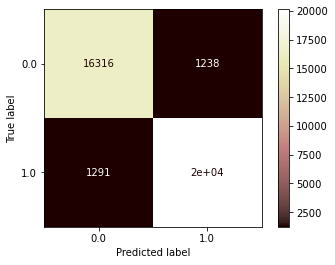

In [163]:
train_acc_list = []
test_acc_list = []

for clf,name in zip(clf_list,clf_name_list):
    y_pred_train = clf.predict(X_train)
    y_pred_test = clf.predict(X_test)
    print(f'Using model: {name}')
    print(f'Trainning Score: {clf.score(X_train, y_train)}')
    print(f'Test Score: {clf.score(X_test, y_test)}')
    print(f'Acc Train: {accuracy_score(y_train, y_pred_train)}')
    print(f'Acc Test: {accuracy_score(y_test, y_pred_test)}')
    train_acc_list.append(accuracy_score(y_train, y_pred_train))
    test_acc_list.append(accuracy_score(y_test, y_pred_test))
    print('======================================================')
    plot_confusion_matrix(rf_clf, X_test, y_test,cmap=plt.cm.pink)

Feature importances using Random Forest

<AxesSubplot:>

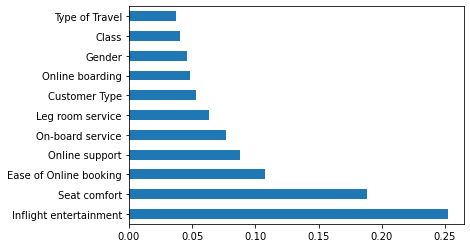

In [164]:

feat_importances = pd.Series(clf.feature_importances_, index=x.columns)
feat_importances.nlargest(20).plot(kind='barh')
#plt.barh(,clf.feature_importances_)

Evaluating Models

Decision tree with hyperparameter tuning

In [165]:
from sklearn.model_selection import GridSearchCV

opt_tree = DecisionTreeClassifier(random_state = 0)

dt_params = {'max_depth':  range(1,20) ,
               }

#9 depths, 10 for sample split, 10 for leaf = 900 permutations

grid_tree = GridSearchCV(opt_tree, dt_params)
grid_tree.fit(X_train, y_train)

GridSearchCV(estimator=DecisionTreeClassifier(random_state=0),
             param_grid={'max_depth': range(1, 20)})

In [166]:
grid_tree.best_params_

{'max_depth': 15}

Training Accuracy using grid search: 0.9479849531435611
Testing Accuracy using grid search: 0.9326557848270198


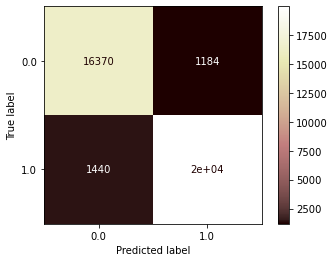

In [167]:
print("Training Accuracy using grid search:",grid_tree.score(X_train,y_train))
print("Testing Accuracy using grid search:",grid_tree.score(X_test,y_test))
plot_confusion_matrix(grid_tree, X_test, y_test,cmap=plt.cm.pink)

In [168]:
best_dt_tree = DecisionTreeClassifier(random_state = 0 ,max_depth = 15 )
best_dt_tree.fit(X_train, y_train)


DecisionTreeClassifier(max_depth=15, random_state=0)

Feature importances using best Decision Tree

<AxesSubplot:>

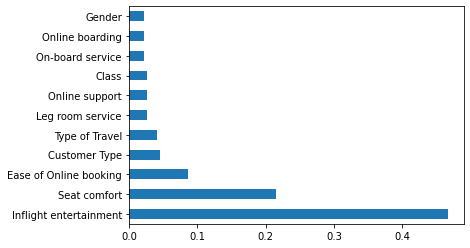

In [169]:

feat_importances_dt = pd.Series(best_dt_tree.feature_importances_, index=x.columns)
feat_importances_dt.nlargest(20).plot(kind='barh')


KNN with hyperparameter tuning

Best k is: {'n_neighbors': 7}
Mean validation score is: 0.9192111471729261
Training accuracy: 0.9203880505081614
Testing accuracy: 0.9203880505081614


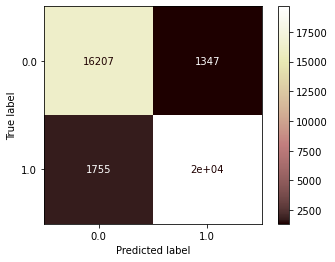

In [170]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier

# define function
knn = KNeighborsClassifier()
# define a list of parameters
param_knn = {'n_neighbors': range(3, 26, 2)}  # exactly the same as the input variable name. 
# range(i, j) from i to j not including j
# range(i, j, s): from i to j not including j, increase by s
#apply grid search
grid_knn = GridSearchCV(knn, param_knn, cv = 5)
grid_knn.fit(X_train, y_train)
# the best hyperparameter chosen:
print("Best k is:", grid_knn.best_params_)
# When k=25 (best case), the validation score of through CV is:
print("Mean validation score is:", grid_knn.best_score_)
print("Training accuracy:",grid_knn.score(X_test,y_test))
print("Testing accuracy:",grid_knn.score(X_test,y_test))
plot_confusion_matrix(grid_knn, X_test, y_test,cmap=plt.cm.pink)

0.9307565958320501


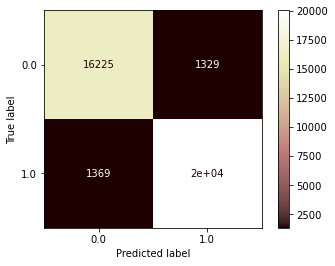

In [171]:
from sklearn.ensemble import AdaBoostClassifier  #learning rate and n_estimators trade off

# Define base model
naive_dt = DecisionTreeClassifier(max_depth=15)

# AdaBoost
ada_clf = AdaBoostClassifier(
    naive_dt, n_estimators=200, learning_rate=0.7,
    random_state=0)

ada_clf.fit(X_train, y_train)

# Performance
print(ada_clf.score(X_test, y_test))
plot_confusion_matrix(ada_clf, X_test, y_test,cmap=plt.cm.pink)

In [172]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
#from xgboost.xgbclassifier import XGBClassifier
#from xgboost import XGBClassifier



model_lr = LogisticRegression().fit(X_train, y_train)
probs_lr = model_lr.predict_proba(X_test)[:, 1]


#model_dt = DecisionTreeClassifier().fit(X_train, y_train)
probs_dt = grid_tree.predict_proba(X_test)[:, 1]



model_rf = RandomForestClassifier().fit(X_train, y_train)
probs_rf = model_rf.predict_proba(X_test)[:, 1]

probs_knn = grid_knn.predict_proba(X_test)[:, 1]

probs_ada = ada_clf.predict_proba(X_test)[:, 1]




#model_xg = XGBClassifier().fit(X_train, y_train)
#probs_xg = model_xg.predict_proba(X_test)[:, 

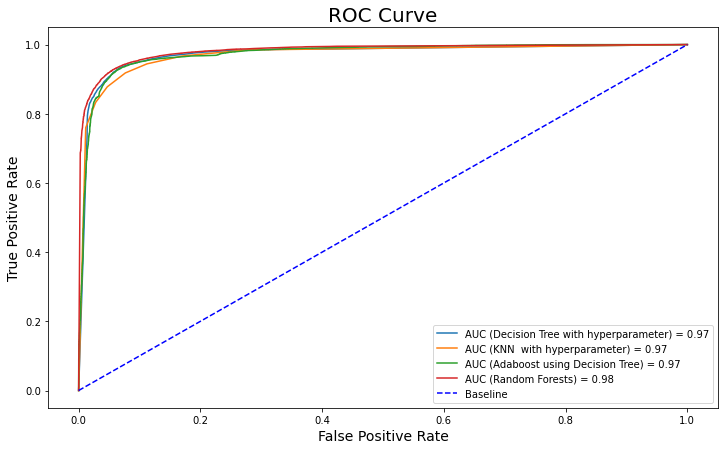

In [173]:
from sklearn.metrics import roc_auc_score, roc_curve



y_test_int = y_test.replace({'satisfied': 1, 'dissatisfied': 0})
auc_lr = roc_auc_score(y_test_int, probs_lr)
fpr_lr, tpr_lr, thresholds_lr = roc_curve(y_test_int, probs_lr)



auc_dt = roc_auc_score(y_test_int, probs_dt)
fpr_dt, tpr_dt, thresholds_dt = roc_curve(y_test_int, probs_dt)



auc_rf = roc_auc_score(y_test_int, probs_rf)
fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test_int, probs_rf)

auc_knn = roc_auc_score(y_test_int, probs_knn)
fpr_knn, tpr_knn, thresholds_knn = roc_curve(y_test_int, probs_knn)

auc_ada = roc_auc_score(y_test_int, probs_ada)
fpr_ada, tpr_ada, thresholds_ada = roc_curve(y_test_int, probs_ada)



#auc_xg = roc_auc_score(y_test_int, probs_xg)
#pr_xg, tpr_xg, thresholds_xg = roc_curve(y_test_int, probs_xg)



plt.figure(figsize=(12, 7))
#plt.plot(fpr_lr, tpr_lr, label=f'AUC (Logistic Regression) = {auc_lr:.2f}')
plt.plot(fpr_dt, tpr_dt, label=f'AUC (Decision Tree with hyperparameter) = {auc_dt:.2f}')
plt.plot(fpr_knn, tpr_knn, label=f'AUC (KNN  with hyperparameter) = {auc_knn:.2f}')
plt.plot(fpr_ada, tpr_ada, label=f'AUC (Adaboost using Decision Tree) = {auc_ada:.2f}')
plt.plot(fpr_rf, tpr_rf, label=f'AUC (Random Forests) = {auc_rf:.2f}')
#plt.plot(fpr_xg, tpr_xg, label=f'AUC (XGBoost) = {auc_xg:.2f}')
plt.plot([0, 1], [0, 1], color='blue', linestyle='--', label='Baseline')
plt.title('ROC Curve', size=20)
plt.xlabel('False Positive Rate', size=14)
plt.ylabel('True Positive Rate', size=14)
plt.legend();

Evaluating models

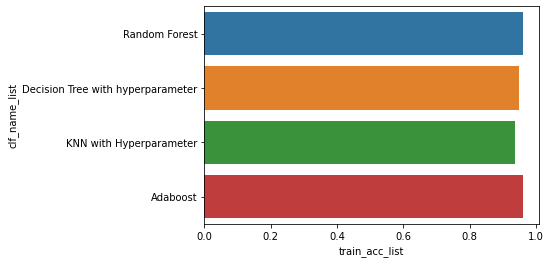

In [174]:
#clf_name_list = [clf.score(X_test, y_test),grid_tree.score(X_test,y_test),grid_knn.score(X_test,y_test),ada_clf.score(X_test, y_test)]

train_acc_list = [clf.score(X_train, y_train),grid_tree.score(X_train,y_train),grid_knn.score(X_train,y_train),ada_clf.score(X_train,y_train)]

df = pd.DataFrame(clf_name_list,columns=["clf_name_list"])
df["train_acc_list"] = train_acc_list
sns.barplot(data=df,y="clf_name_list",x="train_acc_list");

clf_name_list = np.array([clf_name_list]).reshape(4,1)
train_acc_list = np.array([train_acc_list]).reshape(4,1)
df = pd.DataFrame(clf_name_list,columns=["clf_name_list"])
df["train_acc_list"] = train_acc_list
sns.barplot(data=df,y="clf_name_list",x="train_acc_list");

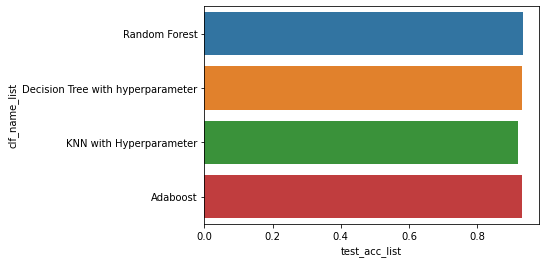

In [175]:

test_acc_list = [clf.score(X_test, y_test),grid_tree.score(X_test,y_test),grid_knn.score(X_test,y_test),ada_clf.score(X_test, y_test)]

df = pd.DataFrame(clf_name_list,columns=["clf_name_list"])
df["test_acc_list"] = test_acc_list
sns.barplot(data=df,y="clf_name_list",x="test_acc_list");

clf_name_list = np.array([clf_name_list]).reshape(4,1)
train_acc_list = np.array([test_acc_list]).reshape(4,1)
df = pd.DataFrame(clf_name_list,columns=["clf_name_list"])
df["test_acc_list"] = test_acc_list
sns.barplot(data=df,y="clf_name_list",x="test_acc_list");